# AMOC Ensemble Calibration via Simulation-Based Inference

Calibration of 6 ocean parameters against DO-event statistics of AMOC time series.

**Method:** SNPE-C (Neural Posterior Estimation) — `sbi` library  
**Parameters:** `diff_dia_min`, `drag_topo_fac`, `slope_max`, `diff_iso`, `diff_gm`, `diff_dia_max`  
**Target statistics:** 4 PCA components of the AMOC KDE PDF + average inter-event waiting time

---

## 1. Data Loading

In [1]:
# =============================
# CONFIGURATION — change ACTIVE_DATASET to switch datasets
# =============================
import os

# Prior bounds shared by the wide-PPE-derived DO-region ensembles below —
# this is the parameter range of ppe_wide_500_10ky, the PPE the GPC was
# trained on in calibrate_do_paper.ipynb. wide_200/wide_700/wide_combined
# were all sampled (via the GPC) within this box, so it's the correct SBI
# prior for them.
_WIDE_PRIOR_BOUNDS = {
    "diff_dia_min":  (3.5e-6, 2.15e-5),
    "drag_topo_fac": (2.4,    3.6),
    "slope_max":     (3.5e-4, 2.15e-3),
    "diff_iso":      (350,    2150),
    "diff_gm":       (350,    2150),
    "diff_dia_max":  (9e-5,   2.1e-4),
}

# Per-dataset manual QC overrides, independent of which PPE_CONFIGS entry
# references the dataset (so wide_200/wide_700 share the same overrides
# whether run standalone or combined). Copied from DO_PPE_CONFIGS in
# calibrate_do_paper.ipynb — same underlying ensembles.
PPE_QC_OVERRIDES = {
    "ppe_do_region_wide_200_75ky_pDO_0.87": {
        # False-DO: algorithm said DO but visual inspection disagrees
        "false_do_run_ids": [51, 88],
        # Exclude entirely: transitional (116,147,166 flattened mid-run) or
        # uncharacteristic detection (8,128,149,162,164,182)
        "exclude_run_ids":  [8, 116, 128, 147, 149, 162, 164, 166, 182],
    },
    "ppe_do_region_wide_700_75ky_pDO_0.7": {
        "false_do_run_ids": [151, 184, 280, 311, 593, 600, 681],
        "exclude_run_ids":  [6, 7, 42, 65, 80, 92, 95, 103, 119, 122, 137, 146, 166, 187, 188, 190,
                              196, 206, 212, 213, 215, 216, 220, 251, 258, 260, 264, 283, 285, 295,
                              314, 325, 327, 335, 339, 347, 359, 366, 584, 585, 586, 589, 616, 622,
                              634, 635, 644, 651, 655, 677, 694, 696, 699],
    },
}

PPE_CONFIGS = {
    "data": {
        "data_dir":          "data",
        "run_length":        75000,  # expected years per run (used to filter incomplete runs)
        "spinup_fraction":   0.02,   # fraction removed from the start as spinup
        "do_crossing_value": 5.0,    # Sv residual crossing threshold for DO event / wait-time detection
        "detection_mode":    "peak_walkback",  # "peak_walkback" or "upward_crossing"
        "do_peak_threshold": 14.0,   # Sv — first KDE peak above this → classified as non-DO run
        "prior_bounds": {
            "diff_dia_min":  (7.5e-6,   1.25e-5),
            "drag_topo_fac": (2.25,     3.75),
            "slope_max":     (7.5e-4,   1.25e-3),
            "diff_iso":      (1125,     1875),
            "diff_gm":       (1125,     1875),
            "diff_dia_max":  (1.125e-4, 1.875e-4),
        },
        "results_dir": ".",
    },
    "data2": {
        "data_dir":          "data2",
        "run_length":        10000,
        "spinup_fraction":   0.1,
        "do_crossing_value": 3.6,
        "detection_mode":    "peak_walkback",
        "do_peak_threshold": 14.0,
        "prior_bounds": {
            "diff_dia_min":  (0.5e-5,  2.0e-5),
            "drag_topo_fac": (2.5,     3.5),
            "slope_max":     (0.5e-3,  2.0e-3),
            "diff_iso":      (500,     2000),
            "diff_gm":       (500,     2000),
            "diff_dia_max":  (1.0e-4,  2.0e-4),
        },
        "results_dir": ".",
    },
    "wide_200": {
        "data_dir":          "ppe_do_region_wide_200_75ky_pDO_0.87",
        "run_length":        75000,
        "spinup_fraction":   0.02,
        "do_crossing_value": 5.0,
        "detection_mode":    "peak_walkback",
        "do_peak_threshold": 14.0,
        "prior_bounds":      _WIDE_PRIOR_BOUNDS,
        "results_dir":       "Results_paper_200",
    },
    "wide_700": {
        "data_dir":          "ppe_do_region_wide_700_75ky_pDO_0.7",
        "run_length":        75000,
        "spinup_fraction":   0.02,
        "do_crossing_value": 5.0,
        "detection_mode":    "peak_walkback",
        "do_peak_threshold": 14.0,
        "prior_bounds":      _WIDE_PRIOR_BOUNDS,
        "results_dir":       "Results_paper_700",
    },
    "wide_combined": {
        # Combine wide_200 + wide_700 into one training set. Run-slot indices
        # are kept unique per dataset via an offset — same pattern as
        # DO_PPE_DIR / do_dataset_offsets in calibrate_do_paper.ipynb.
        "data_dir": ["ppe_do_region_wide_700_75ky_pDO_0.7", "ppe_do_region_wide_200_75ky_pDO_0.87"],
        "run_length":        75000,
        "spinup_fraction":   0.02,
        "do_crossing_value": 5.0,
        "detection_mode":    "peak_walkback",
        "do_peak_threshold": 14.0,
        "prior_bounds":      _WIDE_PRIOR_BOUNDS,
        "results_dir":       "Results_paper_combined",
    },
}

# ← change this to switch datasets: "data", "data2", "wide_200", "wide_700", "wide_combined"
ACTIVE_DATASET = "wide_200"
cfg = PPE_CONFIGS[ACTIVE_DATASET]

# Normalise to a list -- single-dataset path is identical to a list of length 1
# (same pattern as do_ppe_dirs in calibrate_do_paper.ipynb).
DATA_DIRS      = [cfg["data_dir"]] if isinstance(cfg["data_dir"], str) else list(cfg["data_dir"])
data_dir_label = " + ".join(DATA_DIRS)

RESULTS_DIR = cfg.get("results_dir", ".")
os.makedirs(RESULTS_DIR, exist_ok=True)

spinup_fraction   = cfg["spinup_fraction"]
do_crossing_value = cfg["do_crossing_value"]
detection_mode    = cfg["detection_mode"]
do_peak_threshold = cfg["do_peak_threshold"]

In [2]:
import pandas as pd
import numpy as np
import os

param_cols = [
    'ocn.diff_dia_min', 'ocn.drag_topo_fac', 'ocn.slope_max',
    'ocn.diff_iso', 'ocn.diff_gm', 'ocn.diff_dia_max'
]

# Scan each dataset dir for run ids and build a global offset so multiple
# PPEs can be concatenated into one run-slot index space -- mirrors
# do_dataset_offsets / do_param_matrix in calibrate_do_paper.ipynb. For a
# single dataset (DATA_DIRS of length 1) this is just offset=0.
dataset_offsets = {}
dataset_max_ids = {}
n_slots = 0
for data_dir in DATA_DIRS:
    info_path = f'{data_dir}/info.txt'
    if not os.path.exists(info_path):
        raise FileNotFoundError(
            f"Parameter file not found: {info_path}\n"
            "Please place info.txt (whitespace-separated run parameters) in this PPE directory."
        )
    run_ids_i = sorted(
        int(d) for d in os.listdir(data_dir)
        if os.path.isdir(os.path.join(data_dir, d)) and d.isdigit()
    )
    max_id_i = max(run_ids_i) if run_ids_i else 0
    dataset_offsets[data_dir] = n_slots
    dataset_max_ids[data_dir] = max_id_i
    n_slots += max_id_i

# Global (N_slots, 6) parameter matrix, filled per dataset via a runid-indexed
# lookup into that dataset's own info.txt (run ids are only unique within a
# dataset, so this avoids silently misaligning rows once combined).
param_matrix = np.full((n_slots, len(param_cols)), np.nan)
for data_dir in DATA_DIRS:
    offset       = dataset_offsets[data_dir]
    info_i       = pd.read_csv(f'{data_dir}/info.txt', delimiter=r'\s+')
    param_by_rid = info_i.set_index('runid')[param_cols]
    for local_rid in range(1, dataset_max_ids[data_dir] + 1):
        if local_rid in param_by_rid.index:
            param_matrix[offset + local_rid - 1] = param_by_rid.loc[local_rid].values

print(f"Dataset(s): {data_dir_label}")
for data_dir in DATA_DIRS:
    print(f"  {data_dir}: {dataset_max_ids[data_dir]} run slots, offset={dataset_offsets[data_dir]}")
print(f"\nTotal run slots: {n_slots}")
print(f"Parameter matrix shape: {param_matrix.shape}")

print("\nParameter ranges:")
for j, c in enumerate(param_cols):
    col = param_matrix[:, j]
    col = col[~np.isnan(col)]
    print(f"  {c:<20}: [{col.min():.4g}, {col.max():.4g}]")

Dataset(s): ppe_do_region_wide_200_75ky_pDO_0.87
  ppe_do_region_wide_200_75ky_pDO_0.87: 200 run slots, offset=0

Total run slots: 200
Parameter matrix shape: (200, 6)

Parameter ranges:
  ocn.diff_dia_min    : [3.94e-06, 2.14e-05]
  ocn.drag_topo_fac   : [2.407, 3.596]
  ocn.slope_max       : [0.0005454, 0.00213]
  ocn.diff_iso        : [396.7, 2090]
  ocn.diff_gm         : [358.7, 2117]
  ocn.diff_dia_max    : [9.229e-05, 0.0002087]


In [3]:
import xarray as xr
import matplotlib.pyplot as plt
import os

# Global model_files list, one entry per run slot (offset-aligned with
# param_matrix built above). Manual QC exclusions (PPE_QC_OVERRIDES) are
# applied here so excluded runs never enter model_files.
model_files  = [None] * n_slots
missing_ids  = []

for data_dir in DATA_DIRS:
    offset      = dataset_offsets[data_dir]
    exclude_set = set(PPE_QC_OVERRIDES.get(data_dir, {}).get('exclude_run_ids', []))
    for local_rid in range(1, dataset_max_ids[data_dir] + 1):
        slot      = offset + local_rid - 1
        file_path = f"{data_dir}/{local_rid}/ocn_ts.nc"
        if local_rid in exclude_set:
            missing_ids.append(slot + 1)
        elif os.path.exists(file_path):
            model_files[slot] = file_path
        else:
            missing_ids.append(slot + 1)
    if exclude_set:
        print(f"{data_dir}: excluded {sorted(exclude_set)} (manual QC)")

print(f"\nMissing/excluded run files ({len(missing_ids)}) across {data_dir_label}")

print("\nDescriptive Statistics:")
print(pd.DataFrame(param_matrix, columns=param_cols).describe())

ppe_do_region_wide_200_75ky_pDO_0.87: excluded [8, 116, 128, 147, 149, 162, 164, 166, 182] (manual QC)

Missing/excluded run files (9) across ppe_do_region_wide_200_75ky_pDO_0.87

Descriptive Statistics:
       ocn.diff_dia_min  ocn.drag_topo_fac  ocn.slope_max  ocn.diff_iso  \
count        200.000000         200.000000     200.000000    200.000000   
mean           0.000011           3.046143       0.001479   1407.652746   
std            0.000003           0.332796       0.000347    381.622395   
min            0.000004           2.407160       0.000545    396.708873   
25%            0.000008           2.767170       0.001245   1194.046080   
50%            0.000011           3.081777       0.001459   1452.603035   
75%            0.000013           3.330013       0.001767   1694.945863   
max            0.000021           3.596162       0.002130   2090.453407   

       ocn.diff_gm  ocn.diff_dia_max  
count   200.000000        200.000000  
mean   1412.951168          0.000156  
std

## 2. Summary Statistics

Compute KDE PDFs on a **fixed global x-grid** (1st–99th percentile across all ensemble runs, 100 points).  
A fixed grid ensures all PDF values are evaluated at the same AMOC values, making PCA components comparable across runs.

PCA is fitted on the full ensemble of PDFs; the first 4 components are retained.  
DO variability is classified by the location of the first PDF peak:
- **DO run** (first peak ≤ 14 Sv): genuine Dansgaard-Oeschger variability
- **Non-DO run** (first peak > 14 Sv): wild oscillator — treated as a failed simulation in SBI

In [4]:
import importlib, summary_stats as _ss; importlib.reload(_ss); from summary_stats import *
from tqdm.notebook import tqdm

# Default run (calibration target — unchanged across PPEs)
default_file = "../emulator/climberx_output/default_long_run/ocn_ts.nc"
ds_default = xr.open_dataset(default_file)
amoc_default = ds_default.amoc26N.values
time_default = ds_default.time.values
ds_default.close()

expected_length = cfg["run_length"]
print(f"Expected PPE run length : {expected_length} years")
print(f"Spinup fraction         : {spinup_fraction}  ({int(expected_length * spinup_fraction)} years removed)")
print(f"Detection mode          : {detection_mode}")
print(f"DO crossing value       : {do_crossing_value} Sv")

print("\nFirst pass: collecting global AMOC range and filtering incomplete runs...")
all_amoc_concat = []
incomplete_run_ids = []

s0 = int(len(amoc_default) * 0.02)   # default run always uses 2 % spinup
all_amoc_concat.append(amoc_default[s0:])

for i, file in enumerate(tqdm(model_files, desc="Reading AMOC ranges")):
    if file:
        ds = xr.open_dataset(file)
        amoc = ds.amoc26N.values
        ds.close()
        if len(amoc) < expected_length:
            incomplete_run_ids.append(i + 1)
            model_files[i] = None
        else:
            s = int(len(amoc) * spinup_fraction)
            all_amoc_concat.append(amoc[s:])

print(f"Incomplete runs excluded ({len(incomplete_run_ids)}): {incomplete_run_ids}")

all_amoc_flat = np.concatenate(all_amoc_concat)
global_min    = np.percentile(all_amoc_flat, 1)
global_max    = np.percentile(all_amoc_flat, 99)
global_x_grid = np.linspace(global_min, global_max, 100)

print(f"Global AMOC range (1st–99th pct): [{global_min:.2f}, {global_max:.2f}] Sv")
print(f"Fixed grid: {len(global_x_grid)} points")

# Default run always uses the original detection method regardless of dataset config
print("\nComputing default run statistics...")
default_stats = compute_summary_stats(
    amoc_default, time_default, x_grid=global_x_grid,
    do_crossing_value=5.0,
    detection_mode='peak_walkback',
    do_peak_threshold=do_peak_threshold,
)

print(f"Number of model files: {len(model_files)}")

ensemble_stats = []
for file in tqdm(model_files, desc="Computing ensemble stats"):
    if file:
        ds = xr.open_dataset(file)
        amoc = ds.amoc26N.values
        time = ds.time.values
        ds.close()
        stats = compute_summary_stats(
            amoc, time, x_grid=global_x_grid,
            spinup_fraction=spinup_fraction,
            do_crossing_value=do_crossing_value,
            detection_mode=detection_mode,
            do_peak_threshold=do_peak_threshold,
        )
        ensemble_stats.append(stats)
    else:
        ensemble_stats.append(None)

# Manual overrides for known false-positive DO runs (per dataset, mapped to
# global slots via each dataset's offset) -- same pattern as calibrate_do_paper.ipynb.
for data_dir in DATA_DIRS:
    offset    = dataset_offsets[data_dir]
    false_ids = PPE_QC_OVERRIDES.get(data_dir, {}).get('false_do_run_ids', [])
    for local_rid in false_ids:
        idx = offset + local_rid - 1
        if idx < len(ensemble_stats) and ensemble_stats[idx] is not None:
            ensemble_stats[idx]['do_variability']       = False
            ensemble_stats[idx]['n_do_events']          = 0
            ensemble_stats[idx]['avg_waiting_time']     = 0.0
            ensemble_stats[idx]['avg_stadial_duration'] = 0.0
            ensemble_stats[idx]['do_times']             = []
    if false_ids:
        print(f"{data_dir}: overrode {len(false_ids)} false-positive DO runs: {false_ids}")

all_pdfs = [stats['pdf'] for stats in ensemble_stats if stats is not None]
print(f"\nFitting PCA on {len(all_pdfs)} ensemble PDFs...")

pdf_pca_components = 5
pca_model = PCA(n_components=pdf_pca_components)
pca_model.fit(np.array(all_pdfs))

print(f"PCA explained variance ratio: {pca_model.explained_variance_ratio_}")
print(f"Total variance explained: {pca_model.explained_variance_ratio_.sum():.3f}")

default_stats['pca_components'] = pca_model.transform(
    default_stats['pdf'].reshape(1, -1)
).flatten()

for stats in ensemble_stats:
    if stats is not None:
        stats['pca_components'] = pca_model.transform(
            stats['pdf'].reshape(1, -1)
        ).flatten()

valid_stats = [s for s in ensemble_stats if s is not None]
n_do     = sum(s['do_variability'] for s in valid_stats)
n_non_do = len(valid_stats) - n_do
print(f"\nDO variability: {n_do} DO runs, {n_non_do} non-DO runs "
      f"(first PDF peak > {do_peak_threshold} Sv criterion)")
print("Done! All stats now contain 'pca_components' and 'do_variability'")

Expected PPE run length : 75000 years
Spinup fraction         : 0.02  (1500 years removed)
Detection mode          : peak_walkback
DO crossing value       : 5.0 Sv

First pass: collecting global AMOC range and filtering incomplete runs...


Reading AMOC ranges:   0%|          | 0/200 [00:00<?, ?it/s]

Incomplete runs excluded (21): [12, 13, 14, 15, 18, 24, 28, 39, 58, 69, 94, 126, 158, 167, 168, 169, 190, 192, 198, 199, 200]
Global AMOC range (1st–99th pct): [4.31, 29.24] Sv
Fixed grid: 100 points

Computing default run statistics...
Number of model files: 200


Computing ensemble stats:   0%|          | 0/200 [00:00<?, ?it/s]

ppe_do_region_wide_200_75ky_pDO_0.87: overrode 2 false-positive DO runs: [51, 88]

Fitting PCA on 170 ensemble PDFs...
PCA explained variance ratio: [0.41465462 0.27587828 0.14228844 0.06332918 0.03642116]
Total variance explained: 0.933

DO variability: 166 DO runs, 4 non-DO runs (first PDF peak > 14.0 Sv criterion)
Done! All stats now contain 'pca_components' and 'do_variability'


## 3. Ensemble Visualisation

Plot AMOC time series and KDE PDFs for selected ensemble members.  
**Non-DO runs** (wild oscillators) are highlighted with a salmon background.

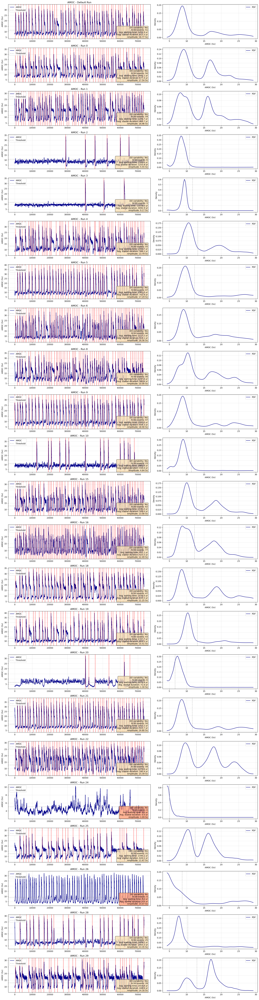

In [5]:
# Option 1: Plot first n runs
fig, axes = plot_amoc_analysis(
    ensemble_stats, model_files,
    default_stats=default_stats, default_file=default_file,
    n_runs=30, spinup_fraction=spinup_fraction,
)

# Option 2: Plot specific run IDs
#fig, axes = plot_amoc_analysis(
#    ensemble_stats, model_files,
#    default_stats=default_stats, default_file=default_file,
#    run_ids=[0, 5, 12, 47, 100], spinup_fraction=spinup_fraction,
#)

## 4. Simulation-Based Inference

Train a **Neural Posterior Estimator (NPE / SNPE-C)** to recover the posterior over the 6 ocean parameters given the summary statistics of the default run.

**Summary statistics** (selected via ablation study): 4 PCA components of the AMOC PDF + average inter-event waiting time.  
Stadial duration was found to be redundant given waiting time and was dropped.

### 4.1 Prior & Summary Statistics

In [6]:
import numpy as np
from sklearn.preprocessing import StandardScaler

# Prior bounds come from the active dataset config
prior_bounds = cfg["prior_bounds"]
param_names  = list(prior_bounds.keys())
lower = np.array([v[0] for v in prior_bounds.values()])
upper = np.array([v[1] for v in prior_bounds.values()])

# ----------------------------
# Filter valid ensemble runs (non-None stats)
# ----------------------------
valid_mask    = np.array([s is not None for s in ensemble_stats])
valid_indices = np.where(valid_mask)[0]
ensemble_valid = [s for s in ensemble_stats if s is not None]

print(f"Valid runs : {len(ensemble_valid)} / {len(ensemble_stats)}")

# ----------------------------
# Build theta: (N, 6) parameter matrix (param_matrix built in section 1,
# offset-aligned with model_files / ensemble_stats)
# ----------------------------
theta_raw = param_matrix[valid_mask]

# ----------------------------
# Build summary statistics x: [PCA_0, ..., PCA_{n-1}, avg_waiting_time]
# ----------------------------
n_pca    = pdf_pca_components
x_pca    = np.array([s['pca_components'][:n_pca] for s in ensemble_valid])
x_scalar = np.array([[s['avg_waiting_time']] for s in ensemble_valid])
x_raw    = np.hstack([x_pca, x_scalar])

print(f"theta shape : {theta_raw.shape}")
print(f"x shape     : {x_raw.shape}  ({n_pca} PCA + waiting time)")

stat_labels = [f"PCA_{i}" for i in range(n_pca)] + ["waiting_time"]
print("\nSummary stat ranges:")
for j, lbl in enumerate(stat_labels):
    print(f"  {lbl:<18}: [{x_raw[:, j].min():10.3g},  {x_raw[:, j].max():10.3g}]")

Valid runs : 170 / 200
theta shape : (170, 6)
x shape     : (170, 6)  (5 PCA + waiting time)

Summary stat ranges:
  PCA_0             : [     -0.37,        0.92]
  PCA_1             : [    -0.576,       0.568]
  PCA_2             : [    -0.264,        1.06]
  PCA_3             : [    -0.234,        0.46]
  PCA_4             : [    -0.295,       0.339]
  waiting_time      : [         0,     1.1e+04]


### 4.2 Normalisation

Parameters are scaled to **[0, 1]** using prior bounds.  
Summary statistics are **standardised** (zero mean, unit variance) across the ensemble.

In [7]:
# ----------------------------
# Normalise theta to [0, 1] using prior bounds.
# ----------------------------
theta_norm = (theta_raw - lower) / (upper - lower)

# ----------------------------
# Standardise summary statistics (zero mean, unit variance).
# ----------------------------
x_scaler = StandardScaler()
x_scaled  = x_scaler.fit_transform(x_raw)

# ----------------------------
# Build and scale the calibration target: default run summary stats
# ----------------------------
x_obs_raw = np.hstack([
    default_stats['pca_components'][:n_pca],
    [default_stats['avg_waiting_time']],
])
x_obs_scaled = x_scaler.transform(x_obs_raw.reshape(1, -1)).flatten()

print("theta_norm range   : [{:.4f}, {:.4f}]".format(theta_norm.min(), theta_norm.max()))
print("x_scaled   mean    :", x_scaled.mean(axis=0).round(3))
print("x_scaled   std     :", x_scaled.std(axis=0).round(3))
print("\nObservation (scaled):", x_obs_scaled.round(3))
print("Observation (raw)   :", x_obs_raw.round(3))

theta_norm range   : [0.0048, 0.9968]
x_scaled   mean    : [-0. -0. -0. -0. -0. -0.]
x_scaled   std     : [1. 1. 1. 1. 1. 1.]

Observation (scaled): [ 0.016  0.475 -0.451  0.65  -0.217 -0.235]
Observation (raw)   : [ 4.00000e-03  9.20000e-02 -6.30000e-02  6.00000e-02 -1.50000e-02
  1.45192e+03]


### 4.3 NPE Training

`exclude_non_do = True` (default): non-DO runs have their summary stats set to `NaN` and are skipped by SNPE via `exclude_invalid_x=True`.  
This prevents the network from learning spurious associations between wild-oscillator parameter regions and DO statistics.

In [8]:
import torch
from sbi.inference import SNPE
from sbi import utils as sbi_utils

torch.manual_seed(42)

# ----------------------------
# Whether to treat non-DO runs (wild oscillators, first PDF peak > 14 Sv)
# as failed simulations in SBI training.
#
# True  — their x is set to NaN; SNPE skips them via exclude_invalid_x=True,
#         so the posterior has no signal (falls back to prior) in those regions.
# False — non-DO runs are included with zeroed waiting times; the network
#         learns that those parameter combinations produce zero DO activity.
# ----------------------------
exclude_non_do = True   # <-- set to False to include non-DO runs

# ----------------------------
# Define prior in normalised parameter space: Uniform([0]^6, [1]^6)
# ----------------------------
prior = sbi_utils.BoxUniform(
    low=torch.zeros(6, dtype=torch.float32),
    high=torch.ones(6, dtype=torch.float32),
)

theta_tensor = torch.tensor(theta_norm, dtype=torch.float32)
x_tensor     = torch.tensor(x_scaled,   dtype=torch.float32)

if exclude_non_do:
    do_var_mask = np.array([s['do_variability'] for s in ensemble_valid])
    n_failed    = (~do_var_mask).sum()
    print(f"Marking {n_failed} non-DO runs as failed simulations (x → NaN)")
    x_tensor_sbi = x_tensor.clone()
    x_tensor_sbi[~do_var_mask] = float('nan')
else:
    print("Using all valid runs (non-DO runs included with zeroed waiting times)")
    x_tensor_sbi = x_tensor

# ----------------------------
# Train NPE (Neural Posterior Estimation, a.k.a. SNPE-C)
# ----------------------------
inference = SNPE(prior=prior)
inference = inference.append_simulations(
    theta_tensor, x_tensor_sbi,
    exclude_invalid_x=exclude_non_do,
)
density_estimator = inference.train(
    training_batch_size=50,
    show_train_summary=True,
)

2026-08-05 15:17:17.796479: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-08-05 15:17:17.997299: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/home/karinako/miniconda3/envs/emulator/lib/python3.11/site-packages/sbi/inference/trainers/npe/npe_base.py:196: UserWarning: Data has extreme outliers in dimension(s) [5] (beyond 10.0x IQR from quartiles). This may cause precision loss during z-scoring, where distinct values become indistinguishable. Consider removing outliers from your data or setting `z_score_x=

Marking 4 non-DO runs as failed simulations (x → NaN)
 Neural network successfully converged after 192 epochs.
        -------------------------
        ||||| ROUND 1 STATS |||||:
        -------------------------
        Epochs trained: 192
        Best validation performance: -3.9902
        -------------------------
        


### 4.4 Posterior Sampling & Summary

In [9]:
# ----------------------------
# Build posterior and draw samples conditioned on the default run
# ----------------------------
posterior = inference.build_posterior(density_estimator)

x_obs_tensor = torch.tensor(x_obs_scaled, dtype=torch.float32)

n_samples = 5000
samples_norm = posterior.sample(
    (n_samples,), x=x_obs_tensor, show_progress_bars=True
).numpy()

# Back-transform to original (physical) parameter space
samples_orig = samples_norm * (upper - lower) + lower

# ----------------------------
# Summary: compare posterior to prior width and to the default value
# ----------------------------
# Default / nominal parameter values (the calibration target's own theta)
default_params = np.array([1e-05, 3.0, 0.001, 1500.0, 1500.0, 0.00015])

print(f"{'Parameter':<20} {'Prior lo':>11} {'Prior hi':>11} "
      f"{'Post mean':>11} {'Post std':>11} {'Default':>11}")
print("-" * 78)
for i, name in enumerate(param_names):
    lo, hi = prior_bounds[name]
    pm = samples_orig[:, i].mean()
    ps = samples_orig[:, i].std()
    print(f"{name:<20} {lo:>11.4g} {hi:>11.4g} {pm:>11.4g} {ps:>11.4g} "
          f"{default_params[i]:>11.4g}")


  0%|          | 0/5000 [00:00<?, ?it/s]

Parameter               Prior lo    Prior hi   Post mean    Post std     Default
------------------------------------------------------------------------------
diff_dia_min             3.5e-06    2.15e-05   1.052e-05   2.294e-06       1e-05
drag_topo_fac                2.4         3.6       3.019      0.2187           3
slope_max                0.00035     0.00215    0.001427   0.0002956       0.001
diff_iso                     350        2150        1589       161.1        1500
diff_gm                      350        2150        1466       233.8        1500
diff_dia_max               9e-05     0.00021   0.0001527   1.811e-05     0.00015


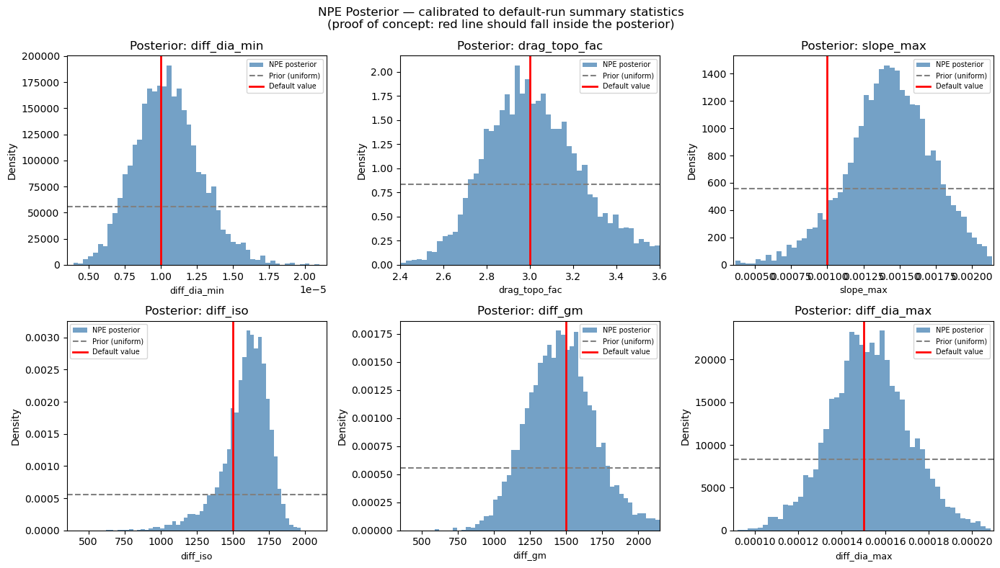

In [10]:
import matplotlib.pyplot as plt

# Default parameter values (used as a proof-of-concept reference)
default_params = np.array([1e-05, 3.0, 0.001, 1500.0, 1500.0, 0.00015])

fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()

for i, (ax, name) in enumerate(zip(axes, param_names)):
    lo, hi = prior_bounds[name]
    prior_density = 1.0 / (hi - lo)

    ax.hist(samples_orig[:, i], bins=50, density=True,
            color='steelblue', alpha=0.75, label='NPE posterior')
    ax.axhline(prior_density, color='gray', linestyle='--',
               linewidth=1.5, label='Prior (uniform)')
    ax.axvline(default_params[i], color='red', linestyle='-',
               linewidth=2, label='Default value')

    ax.set_xlabel(name, fontsize=9)
    ax.set_ylabel('Density')
    ax.set_title(f'Posterior: {name}')
    ax.set_xlim(lo, hi)
    ax.legend(fontsize=7)

plt.suptitle(
    'NPE Posterior — calibrated to default-run summary statistics\n'
    '(proof of concept: red line should fall inside the posterior)',
    fontsize=12
)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/npe_posterior_{ACTIVE_DATASET}.png', dpi=150, bbox_inches='tight')
plt.show()

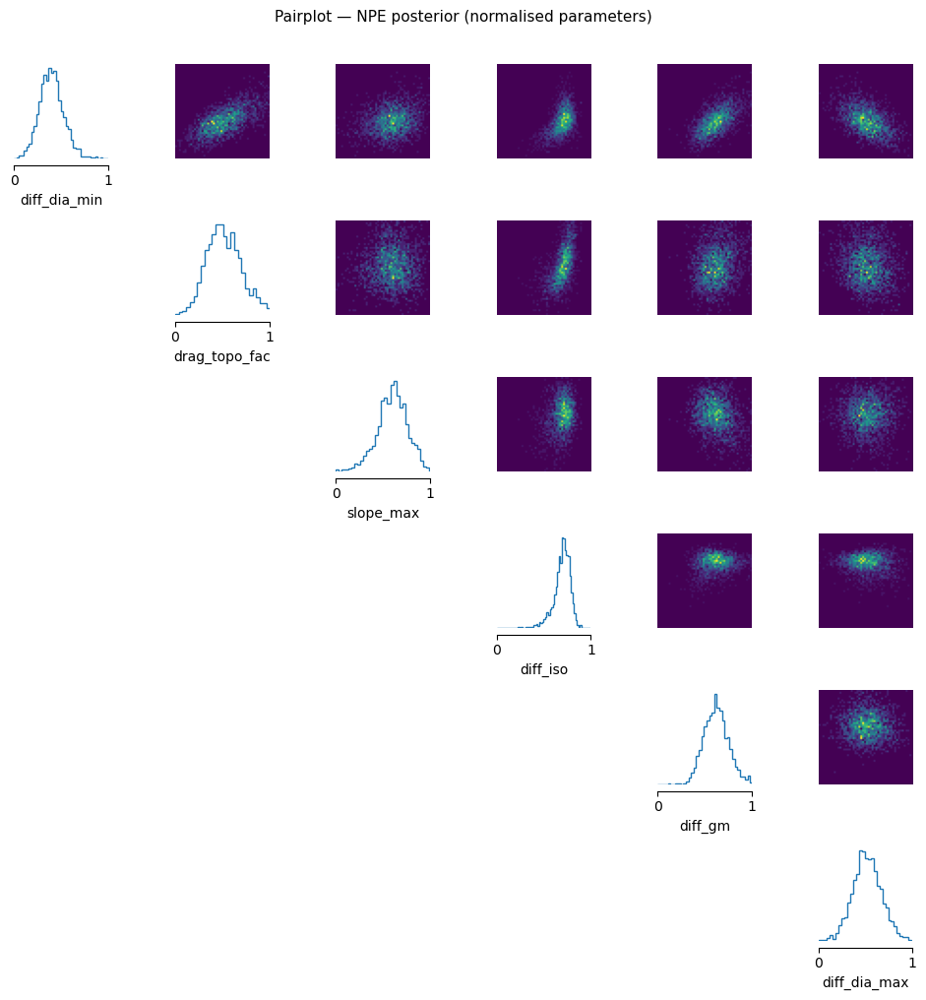

In [11]:
from sbi.analysis import pairplot

fig, axes = pairplot(
    torch.tensor(samples_norm[:2000], dtype=torch.float32),
    labels=param_names,
    limits=[[0.0, 1.0]] * 6,
    figsize=(10, 10),
)
plt.suptitle('Pairplot — NPE posterior (normalised parameters)', y=1.01, fontsize=11)
plt.tight_layout()
plt.show()


### 4.5 PPE Member Weighting

Evaluate the posterior log-probability of each ensemble member's parameters given the default-run observation.  
High-weight runs are those whose parameter combinations are consistent with the calibration target.

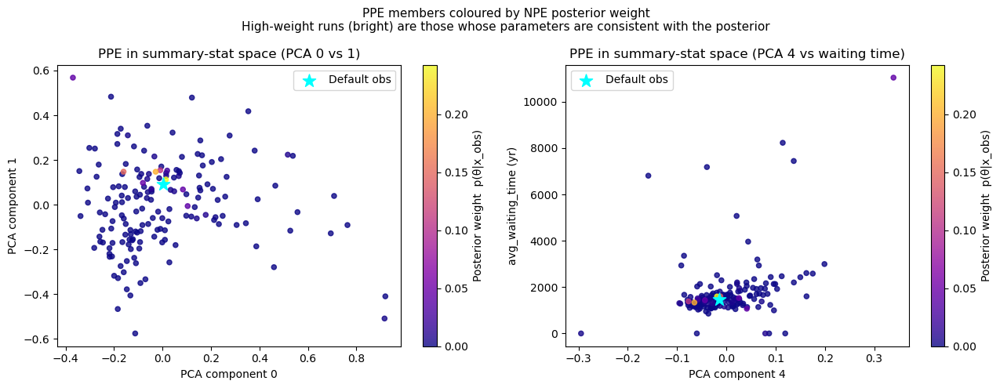

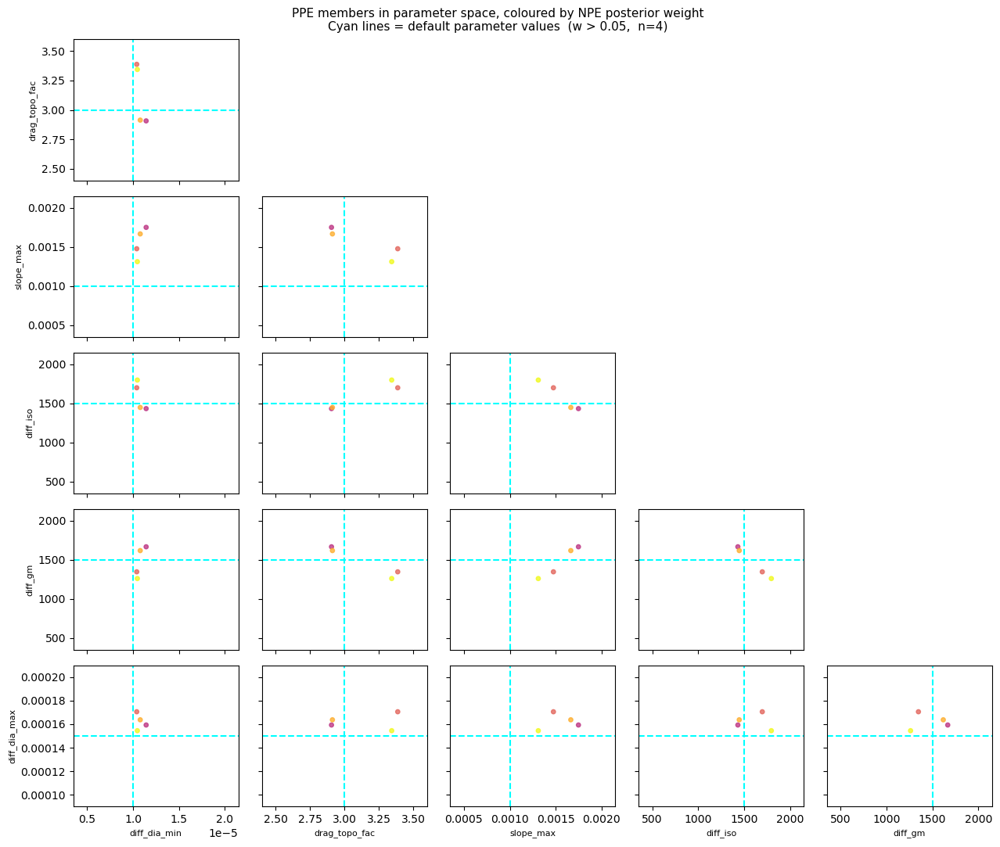

In [12]:
# ----------------------------
# Posterior weight for each PPE member
# Evaluate log p(theta_i | x_obs) under the trained NPE for every
# ensemble run whose parameters we have.  This gives a direct,
# model-based connection between the posterior and the PPE.
# ----------------------------
with torch.no_grad():
    log_w = posterior.log_prob(
        theta_tensor, x=x_obs_tensor
    ).numpy()

# Relative weights (numerically stable softmax-style normalisation)
w = np.exp(log_w - log_w.max())
w /= w.sum()

# Sort so high-weight points are drawn on top
order = np.argsort(w)

# ----------------------------
# Figure 1: summary-stat space, coloured by posterior weight
# ----------------------------
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

ax = axes[0]
sc = ax.scatter(x_raw[order, 0], x_raw[order, 1],
                c=w[order], cmap='plasma', s=20, alpha=0.8)
ax.scatter(x_obs_raw[0], x_obs_raw[1], color='cyan', s=150,
           zorder=6, marker='*', label='Default obs')
plt.colorbar(sc, ax=ax, label='Posterior weight  p(θ|x_obs)')
ax.set_xlabel('PCA component 0')
ax.set_ylabel('PCA component 1')
ax.set_title('PPE in summary-stat space (PCA 0 vs 1)')
ax.legend()

ax = axes[1]
# x_raw columns: [PCA_0, ..., PCA_{n_pca-1}, avg_waiting_time]
# -2 = last PCA component,  -1 = avg_waiting_time
sc = ax.scatter(x_raw[order, -2], x_raw[order, -1],
                c=w[order], cmap='plasma', s=20, alpha=0.8)
ax.scatter(x_obs_raw[-2], x_obs_raw[-1], color='cyan', s=150,
           zorder=6, marker='*', label='Default obs')
plt.colorbar(sc, ax=ax, label='Posterior weight  p(θ|x_obs)')
ax.set_xlabel(f'PCA component {n_pca - 1}')
ax.set_ylabel('avg_waiting_time (yr)')
ax.set_title(f'PPE in summary-stat space (PCA {n_pca - 1} vs waiting time)')
ax.legend()

plt.suptitle(
    'PPE members coloured by NPE posterior weight\n'
    'High-weight runs (bright) are those whose parameters are '
    'consistent with the posterior',
    fontsize=11
)
plt.tight_layout()
plt.show()

# ----------------------------
# Figure 2: parameter space, coloured by posterior weight
# Set weight_threshold=None to show all points, or e.g. 0.075 to
# show only runs above that weight.
# ----------------------------
weight_threshold = 0.05#None   
n_params = len(param_names)

if weight_threshold is not None:
    mask = w > weight_threshold
    theta_plot = theta_raw[mask]
    w_plot     = w[mask]
    order_plot = np.argsort(w_plot)
    title_suffix = f'  (w > {weight_threshold},  n={mask.sum()})'
else:
    theta_plot = theta_raw[order]
    w_plot     = w[order]
    order_plot = np.arange(len(w_plot))
    title_suffix = f'  (all {len(w_plot)} runs)'

fig, axes = plt.subplots(n_params - 1, n_params - 1,
                         figsize=(13, 11), squeeze=False)

for row in range(n_params - 1):
    for col in range(n_params - 1):
        ax = axes[row][col]
        if col > row:
            ax.set_visible(False)
            continue
        xi, yi = col, row + 1
        lo_x, hi_x = prior_bounds[param_names[xi]]
        lo_y, hi_y = prior_bounds[param_names[yi]]

        sc = ax.scatter(theta_plot[order_plot, xi], theta_plot[order_plot, yi],
                        c=w_plot[order_plot], cmap='plasma', s=15, alpha=0.8,
                        vmin=w.min(), vmax=w.max())
        ax.axvline(default_params[xi], color='cyan', linewidth=1.5, linestyle='--')
        ax.axhline(default_params[yi], color='cyan', linewidth=1.5, linestyle='--')
        ax.set_xlim(lo_x, hi_x)
        ax.set_ylim(lo_y, hi_y)

        if row == n_params - 2:
            ax.set_xlabel(param_names[xi], fontsize=8)
        else:
            ax.set_xticklabels([])
        if col == 0:
            ax.set_ylabel(param_names[yi], fontsize=8)
        else:
            ax.set_yticklabels([])

plt.suptitle(
    'PPE members in parameter space, coloured by NPE posterior weight\n'
    'Cyan lines = default parameter values' + title_suffix,
    fontsize=11
)
plt.tight_layout()
plt.show()


Runs with posterior weight > 0.075: 4
Run IDs : [9, 58, 89, 175]
Weights : [0.2425 0.1485 0.1088 0.1997]


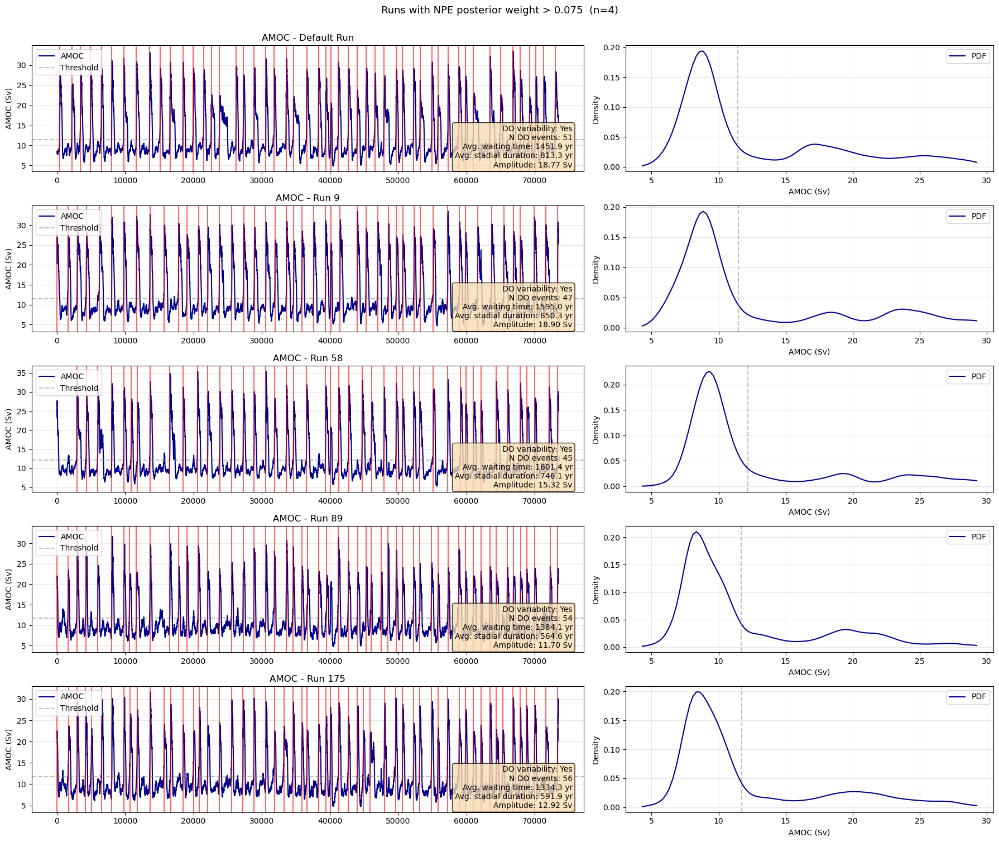

In [13]:
# ----------------------------
# Plot AMOC time series and PDFs for high-posterior-weight runs
# ----------------------------
threshold = 0.075
high_weight_mask = w > threshold

valid_indices = np.where(valid_mask)[0]
high_weight_run_ids = valid_indices[high_weight_mask].tolist()

print(f"Runs with posterior weight > {threshold}: {len(high_weight_run_ids)}")
print(f"Run IDs : {high_weight_run_ids}")
print(f"Weights : {w[high_weight_mask].round(4)}")

fig, axes = plot_amoc_analysis(
    ensemble_stats, model_files,
    default_stats=default_stats, default_file=default_file,
    run_ids=high_weight_run_ids,
    show_default=True, spinup_fraction=spinup_fraction,
)
plt.suptitle(
    f'Runs with NPE posterior weight > {threshold}  '
    f'(n={len(high_weight_run_ids)})',
    fontsize=13, y=1.002
)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/predictive_simulations_from_ppe_{ACTIVE_DATASET}.png', dpi=150, bbox_inches='tight')
plt.show()

### 4.6 Identifiability Diagnostics

Model-free checks for non-identifiability: runs that are **close in summary-stat space but far in parameter space** indicate that multiple parameter combinations produce indistinguishable AMOC statistics.

- **Non-identifiability scatter**: x-distance vs θ-distance from the default  
- **Nearest-neighbour plot**: the N runs closest to the default observation in scaled x-space, with their parameter locations and time series

x-distance threshold    : 1.049  (17 runs below)
theta-distance threshold: 0.500  (7 runs above among close-x)
  Close in x, far in θ  : 7  (non-identifiable candidates)
  Close in x, near θ    : 10   (well-identified)


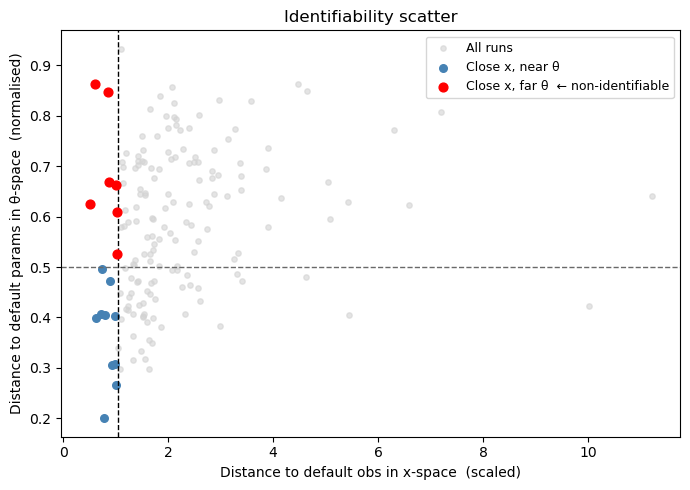

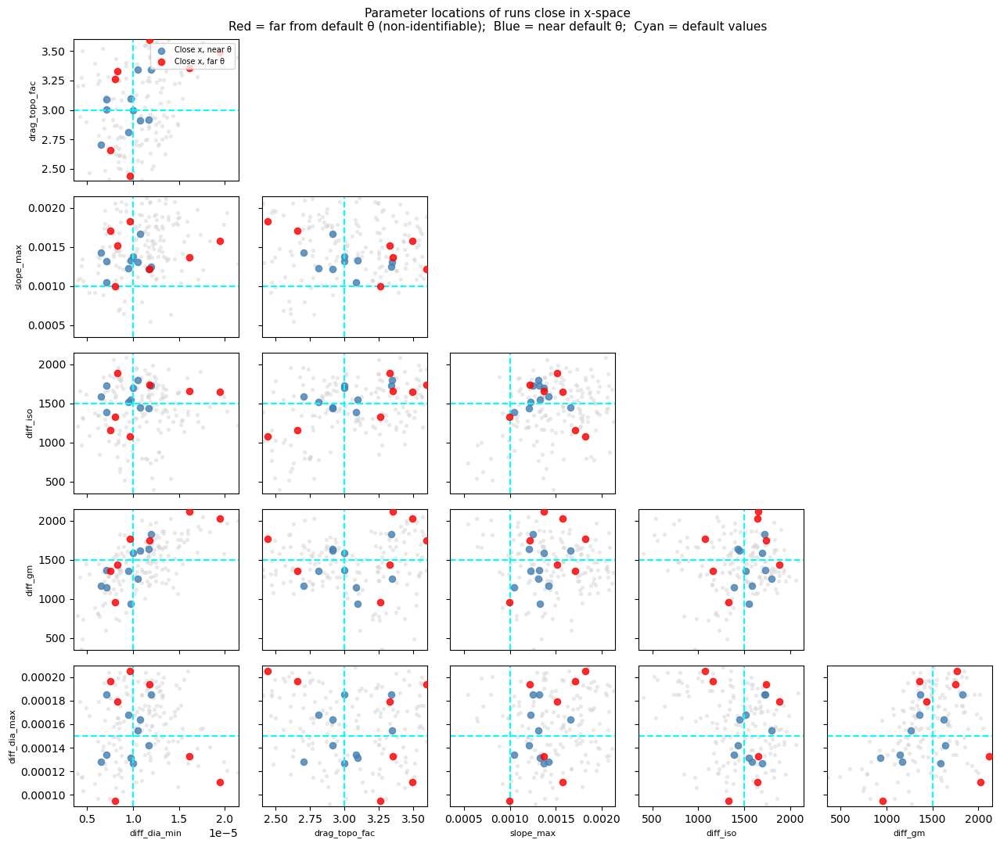

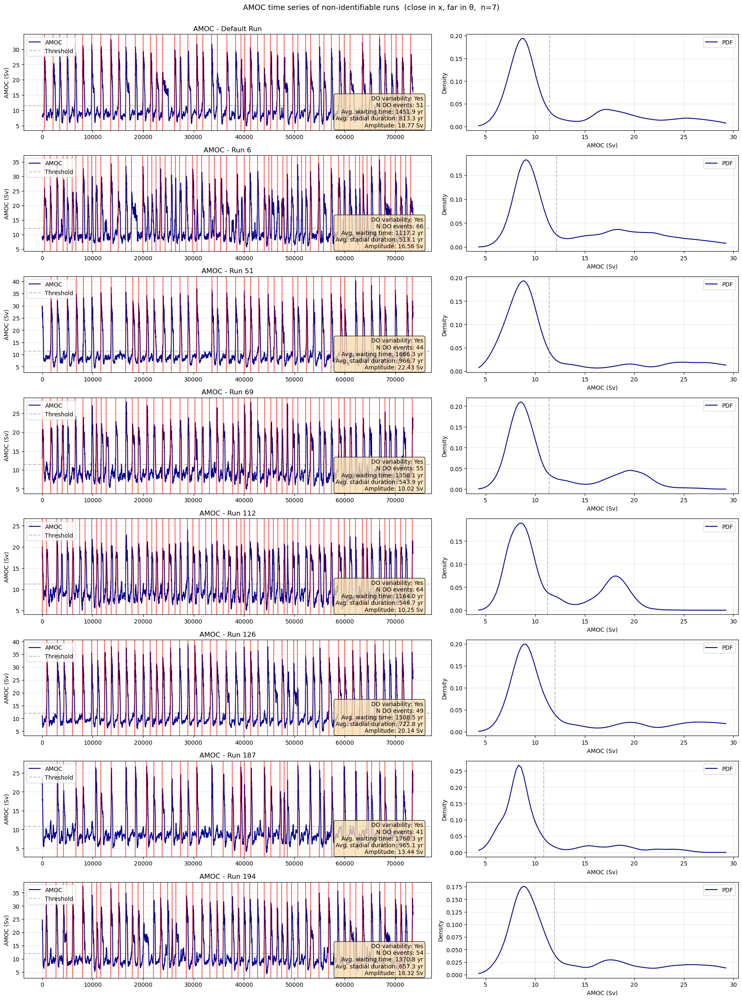

In [14]:
# ----------------------------
# Non-identifiability diagnostic (no SBI)
# Find runs that are close to the default in x-space but far in
# parameter space — these are the problematic runs for identifiability.
# ----------------------------

dist_full  = np.linalg.norm(x_scaled - x_obs_scaled, axis=1)

x_threshold     = np.percentile(dist_full, 10)
theta_threshold = 0.5

default_params_norm = (default_params - lower) / (upper - lower)
dist_theta = np.linalg.norm(theta_norm - default_params_norm, axis=1)

close_x   = dist_full  < x_threshold
far_theta = dist_theta > theta_threshold

confusing = close_x & far_theta
expected  = close_x & ~far_theta

print(f"x-distance threshold    : {x_threshold:.3f}  ({(close_x).sum()} runs below)")
print(f"theta-distance threshold: {theta_threshold:.3f}  ({(far_theta & close_x).sum()} runs above among close-x)")
print(f"  Close in x, far in θ  : {confusing.sum()}  (non-identifiable candidates)")
print(f"  Close in x, near θ    : {expected.sum()}   (well-identified)")

fig, ax = plt.subplots(figsize=(7, 5))
ax.scatter(dist_full, dist_theta, color='lightgrey', s=15, alpha=0.6, zorder=1, label='All runs')
ax.scatter(dist_full[expected], dist_theta[expected], color='steelblue', s=30, zorder=2, label='Close x, near θ')
ax.scatter(dist_full[confusing], dist_theta[confusing], color='red', s=40, zorder=3, label='Close x, far θ  ← non-identifiable')
ax.axvline(x_threshold,     color='black',  linestyle='--', linewidth=1)
ax.axhline(theta_threshold, color='dimgray', linestyle='--', linewidth=1)
ax.set_xlabel('Distance to default obs in x-space  (scaled)')
ax.set_ylabel('Distance to default params in θ-space  (normalised)')
ax.set_title('Identifiability scatter')
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()

theta_conf = theta_raw[confusing]
theta_exp  = theta_raw[expected]

fig, axes = plt.subplots(n_params - 1, n_params - 1, figsize=(13, 11), squeeze=False)
for row in range(n_params - 1):
    for col in range(n_params - 1):
        ax = axes[row][col]
        if col > row:
            ax.set_visible(False)
            continue
        xi, yi = col, row + 1
        lo_x, hi_x = prior_bounds[param_names[xi]]
        lo_y, hi_y = prior_bounds[param_names[yi]]
        ax.scatter(theta_raw[:, xi], theta_raw[:, yi], color='lightgrey', s=8, alpha=0.4, zorder=1)
        ax.scatter(theta_exp[:, xi], theta_exp[:, yi], color='steelblue', s=35, alpha=0.8, zorder=2, label='Close x, near θ')
        ax.scatter(theta_conf[:, xi], theta_conf[:, yi], color='red', s=35, alpha=0.8, zorder=3, label='Close x, far θ')
        ax.axvline(default_params[xi], color='cyan', linewidth=1.5, linestyle='--')
        ax.axhline(default_params[yi], color='cyan', linewidth=1.5, linestyle='--')
        ax.set_xlim(lo_x, hi_x)
        ax.set_ylim(lo_y, hi_y)
        if row == n_params - 2:
            ax.set_xlabel(param_names[xi], fontsize=8)
        else:
            ax.set_xticklabels([])
        if col == 0:
            ax.set_ylabel(param_names[yi], fontsize=8)
        else:
            ax.set_yticklabels([])
axes[0][0].legend(fontsize=7, loc='upper right')
plt.suptitle('Parameter locations of runs close in x-space\nRed = far from default θ (non-identifiable);  Blue = near default θ;  Cyan = default values', fontsize=11)
plt.tight_layout()
plt.show()

conf_run_ids = valid_indices[confusing].tolist()
if conf_run_ids:
    fig, axes = plot_amoc_analysis(
        ensemble_stats, model_files,
        default_stats=default_stats, default_file=default_file,
        run_ids=conf_run_ids, show_default=True, spinup_fraction=spinup_fraction,
    )
    plt.suptitle(f'AMOC time series of non-identifiable runs  (close in x, far in θ,  n={len(conf_run_ids)})', fontsize=13, y=1.002)
    plt.tight_layout()
    plt.show()
else:
    print("No confusing runs found — try relaxing the thresholds.")

Top-20 nearest runs (full 6D x-space):
  Run IDs : [69, 112, 9, 21, 188, 100, 162, 6, 194, 85, 76, 143, 175, 193, 126, 187, 51, 141, 66, 89]
  Distances: [0.501 0.613 0.623 0.718 0.745 0.769 0.801 0.862 0.864 0.886 0.936 0.985
 0.995 0.998 1.007 1.026 1.034 1.051 1.087 1.088]


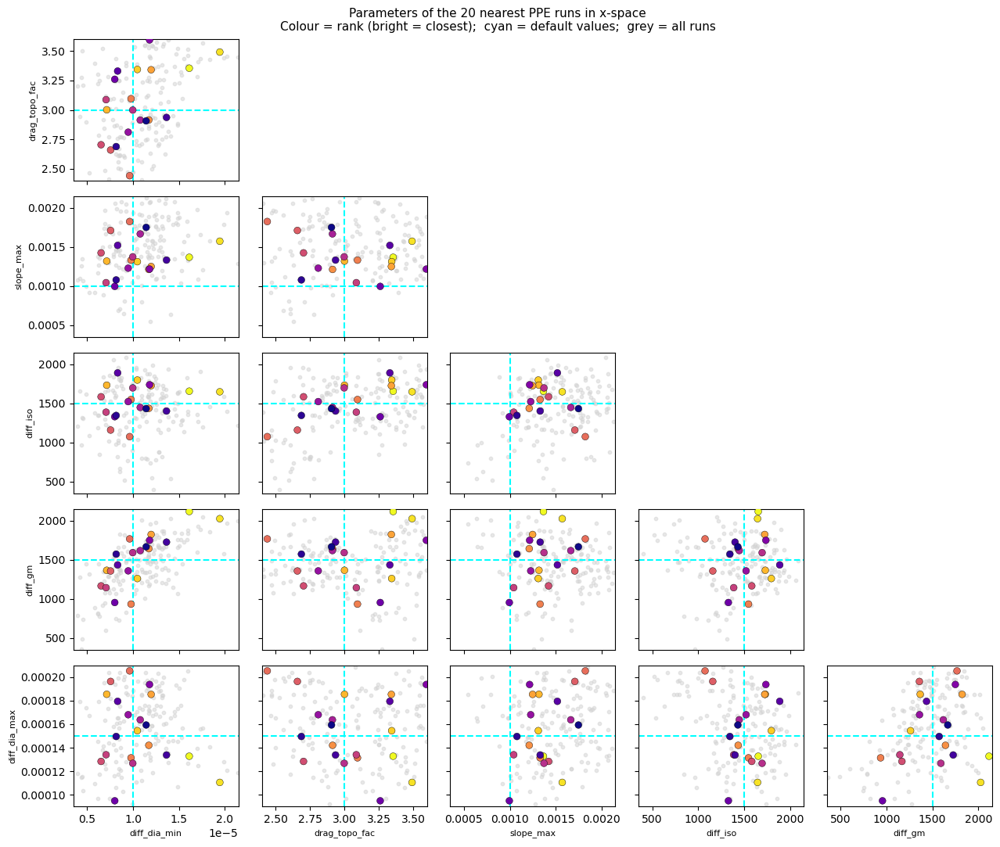

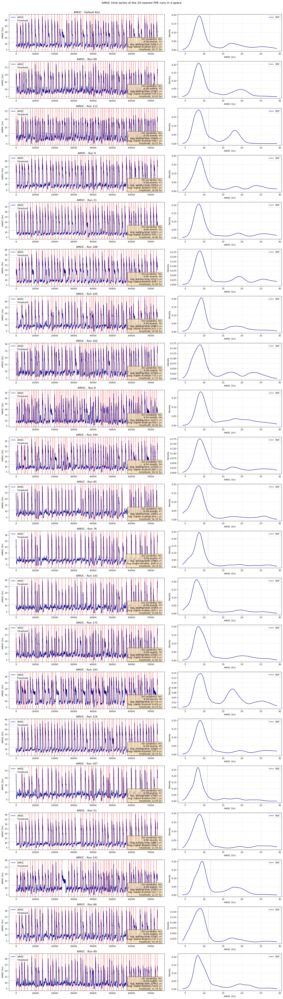

In [15]:
# ----------------------------
# Nearest-neighbour diagnostic (no SBI)
# Find the PPE runs closest to the default observation in full
# summary-stat space and inspect their parameters + time series.
# ----------------------------
n_nearest = 20   # <-- change this

dist_full = np.linalg.norm(x_scaled - x_obs_scaled, axis=1)
nearest_idx_in_valid = np.argsort(dist_full)[:n_nearest]

valid_indices   = np.where(valid_mask)[0]
nearest_run_ids = valid_indices[nearest_idx_in_valid].tolist()

print(f"Top-{n_nearest} nearest runs (full {x_scaled.shape[1]}D x-space):")
print(f"  Run IDs : {nearest_run_ids}")
print(f"  Distances: {dist_full[nearest_idx_in_valid].round(3)}")

theta_near = theta_raw[nearest_idx_in_valid]

fig, axes = plt.subplots(n_params - 1, n_params - 1, figsize=(13, 11), squeeze=False)
for row in range(n_params - 1):
    for col in range(n_params - 1):
        ax = axes[row][col]
        if col > row:
            ax.set_visible(False)
            continue
        xi, yi = col, row + 1
        lo_x, hi_x = prior_bounds[param_names[xi]]
        lo_y, hi_y = prior_bounds[param_names[yi]]
        ax.scatter(theta_raw[:, xi], theta_raw[:, yi], color='lightgrey', s=10, alpha=0.5, zorder=1)
        sc = ax.scatter(theta_near[:, xi], theta_near[:, yi],
                        c=np.arange(n_nearest), cmap='plasma_r',
                        s=40, zorder=3, edgecolors='k', linewidths=0.3)
        ax.axvline(default_params[xi], color='cyan', linewidth=1.5, linestyle='--')
        ax.axhline(default_params[yi], color='cyan', linewidth=1.5, linestyle='--')
        ax.set_xlim(lo_x, hi_x)
        ax.set_ylim(lo_y, hi_y)
        if row == n_params - 2:
            ax.set_xlabel(param_names[xi], fontsize=8)
        else:
            ax.set_xticklabels([])
        if col == 0:
            ax.set_ylabel(param_names[yi], fontsize=8)
        else:
            ax.set_yticklabels([])
plt.suptitle(f'Parameters of the {n_nearest} nearest PPE runs in x-space\nColour = rank (bright = closest);  cyan = default values;  grey = all runs', fontsize=11)
plt.tight_layout()
plt.show()

fig, axes = plot_amoc_analysis(
    ensemble_stats, model_files,
    default_stats=default_stats, default_file=default_file,
    run_ids=nearest_run_ids,
    show_default=True, spinup_fraction=spinup_fraction,
)
plt.suptitle(f'AMOC time series of the {n_nearest} nearest PPE runs in x-space', fontsize=13, y=1.002)
plt.tight_layout()
plt.show()

### 4.7 KDE-of-PPE Prior

Section 4.3 declares `prior = BoxUniform([0]^6, [1]^6)` -- flat over the
`prior_bounds` box. But `wide_200`/`wide_700` weren't sampled uniformly over
that box: they're GPC-targeted (`P(DO)` above a threshold), so the actual
training θ cluster in a non-uniform, non-trivial shape within it. SNPE
assumes the training θ are drawn from the declared `prior`; declaring
`BoxUniform` while training on a non-uniformly-sampled θ set is a mismatch.

`calibrate_do_paper.ipynb`'s MCMC approach avoids this by using a
`gaussian_kde` fit on the training θ as the prior (`KDEPriorEmulatorMCMC`).
This section does the same for NPE: fit a KDE on the θ that actually inform
training (DO runs only, when `exclude_non_do=True` -- non-DO rows are
dropped via `exclude_invalid_x` so they never contribute to the loss), wrap
it as an sbi-compatible prior via `process_prior`, and retrain NPE with it.
Because the training θ are (by construction) drawn from this same empirical
density, `proposal == prior` here -- no separate proposal-correction is
needed, unlike a genuine sequential/multi-round SNPE setup.

`posterior_kde` (this section) is kept in separate variables from the
Uniform-prior `posterior` built in section 4.4, so both remain available for
comparison -- but the forward-model-validation sampling in section 4.8 below
draws from `posterior_kde`, since it's the methodologically consistent choice
(it matches how wide_200/wide_700 were actually sampled).

In [19]:
from scipy.stats import gaussian_kde
from sbi.utils.user_input_checks import process_prior


class KDEPrior:
    """Gaussian-KDE prior over [0,1]^6, wrapped for sbi via process_prior."""

    def __init__(self, theta_norm_train, bw_method=None, seed=0):
        self._kde = gaussian_kde(theta_norm_train.T, bw_method=bw_method)
        self._dim = theta_norm_train.shape[1]
        self._rng = np.random.default_rng(seed)

    def sample(self, sample_shape=torch.Size()):
        n = int(np.prod(sample_shape)) if len(sample_shape) else 1
        out = np.empty((0, self._dim))
        while len(out) < n:
            draw = self._kde.resample(max(n - len(out), 1), seed=self._rng).T
            keep = np.all((draw >= 0.0) & (draw <= 1.0), axis=1)
            out = np.vstack([out, draw[keep]])
        return torch.as_tensor(out[:n], dtype=torch.float32)

    def log_prob(self, theta):
        theta_np = theta.detach().cpu().numpy() if torch.is_tensor(theta) else np.asarray(theta)
        theta_np = np.atleast_2d(theta_np)
        in_box = np.all((theta_np >= 0.0) & (theta_np <= 1.0), axis=1)
        logp = np.full(len(theta_np), -np.inf)
        if in_box.any():
            logp[in_box] = self._kde.logpdf(theta_np[in_box].T)
        return torch.as_tensor(logp, dtype=torch.float32)


kde_train_theta = theta_norm[do_var_mask] if exclude_non_do else theta_norm
print(f"Fitting KDE prior on {len(kde_train_theta)} theta rows "
      f"({'DO runs only' if exclude_non_do else 'all valid runs'})")

kde_prior_raw = KDEPrior(kde_train_theta)
prior_kde, _, _ = process_prior(
    kde_prior_raw,
    custom_prior_wrapper_kwargs={
        'lower_bound': torch.zeros(6, dtype=torch.float32),
        'upper_bound': torch.ones(6, dtype=torch.float32),
    },
)

Fitting KDE prior on 166 theta rows (DO runs only)


/home/karinako/miniconda3/envs/emulator/lib/python3.11/site-packages/sbi/utils/user_input_checks_utils.py:90: UserWarning: Prior is lacking mean attribute, estimating prior mean from samples.
  self._set_mean_and_variance()
/home/karinako/miniconda3/envs/emulator/lib/python3.11/site-packages/sbi/utils/user_input_checks_utils.py:90: UserWarning: Prior is lacking variance attribute, estimating prior variance from samples.
  self._set_mean_and_variance()


In [20]:
# ----------------------------
# Retrain NPE with the KDE prior (separate variables -- does not touch/
# overwrite the Uniform-prior `inference`/`posterior` from section 4.3/4.4,
# so both are available side by side for comparison).
# ----------------------------
inference_kde = SNPE(prior=prior_kde)
inference_kde = inference_kde.append_simulations(
    theta_tensor, x_tensor_sbi,
    exclude_invalid_x=exclude_non_do,
)
density_estimator_kde = inference_kde.train(
    training_batch_size=50,
    show_train_summary=True,
)

posterior_kde = inference_kde.build_posterior(density_estimator_kde)
samples_norm_kde = posterior_kde.sample(
    (n_samples,), x=x_obs_tensor, show_progress_bars=True
).numpy()
samples_orig_kde = samples_norm_kde * (upper - lower) + lower

print(f"\n{'Parameter':<20} {'Uniform-prior mean':>19} {'Uniform-prior std':>19} "
      f"{'KDE-prior mean':>16} {'KDE-prior std':>15} {'Default':>11}")
print("-" * 105)
for i, name in enumerate(param_names):
    pm_u, ps_u = samples_orig[:, i].mean(), samples_orig[:, i].std()
    pm_k, ps_k = samples_orig_kde[:, i].mean(), samples_orig_kde[:, i].std()
    print(f"{name:<20} {pm_u:>19.4g} {ps_u:>19.4g} {pm_k:>16.4g} {ps_k:>15.4g} "
          f"{default_params[i]:>11.4g}")

/home/karinako/miniconda3/envs/emulator/lib/python3.11/site-packages/sbi/inference/trainers/npe/npe_base.py:196: UserWarning: Data has extreme outliers in dimension(s) [5] (beyond 10.0x IQR from quartiles). This may cause precision loss during z-scoring, where distinct values become indistinguishable. Consider removing outliers from your data or setting `z_score_x='none'` (though this may affect training).
  warn_if_invalid_for_zscoring(x)


 Neural network successfully converged after 158 epochs.
        -------------------------
        ||||| ROUND 1 STATS |||||:
        -------------------------
        Epochs trained: 158
        Best validation performance: -4.1619
        -------------------------
        


  0%|          | 0/5000 [00:00<?, ?it/s]


Parameter             Uniform-prior mean   Uniform-prior std   KDE-prior mean   KDE-prior std     Default
---------------------------------------------------------------------------------------------------------
diff_dia_min                   1.052e-05           2.294e-06        1.106e-05       2.336e-06       1e-05
drag_topo_fac                      3.019              0.2187            3.056          0.2353           3
slope_max                       0.001427           0.0002956         0.001442       0.0002766       0.001
diff_iso                            1589               161.1             1600           181.3        1500
diff_gm                             1466               233.8             1515           227.3        1500
diff_dia_max                   0.0001527           1.811e-05         0.000153        1.96e-05     0.00015


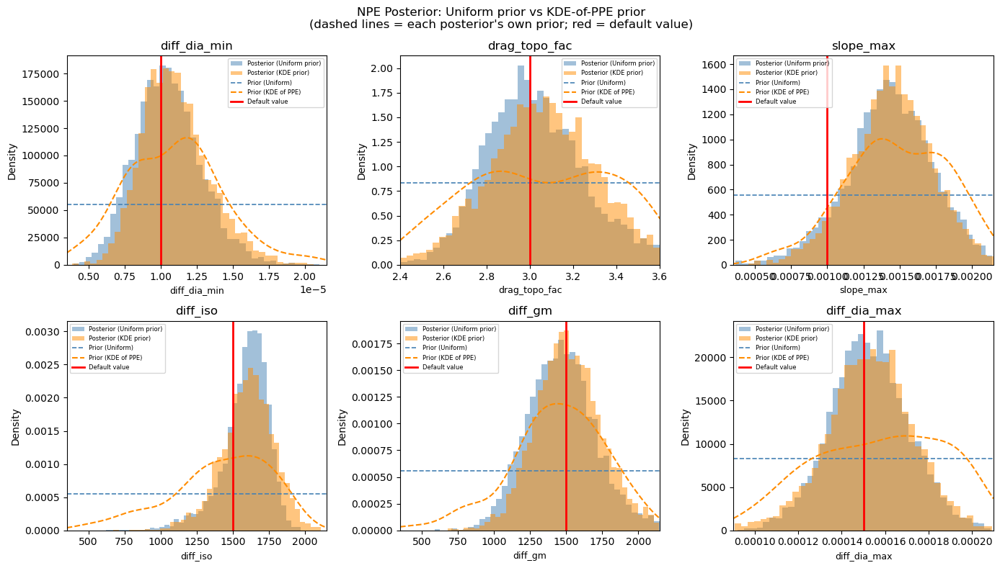

In [21]:
# ----------------------------
# Compare the two posteriors' 1-D marginals, each against its own prior
# ----------------------------
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()

for i, (ax, name) in enumerate(zip(axes, param_names)):
    lo, hi = prior_bounds[name]
    grid = np.linspace(lo, hi, 300)

    ax.hist(samples_orig[:, i], bins=40, density=True, color='steelblue',
            alpha=0.5, label='Posterior (Uniform prior)')
    ax.hist(samples_orig_kde[:, i], bins=40, density=True, color='darkorange',
            alpha=0.5, label='Posterior (KDE prior)')

    prior_density = 1.0 / (hi - lo)
    ax.axhline(prior_density, color='steelblue', linestyle='--', linewidth=1.2,
               label='Prior (Uniform)')

    kde_1d = gaussian_kde(kde_train_theta[:, i] * (hi - lo) + lo)
    ax.plot(grid, kde_1d(grid), color='darkorange', linestyle='--', linewidth=1.5,
            label='Prior (KDE of PPE)')

    ax.axvline(default_params[i], color='red', linewidth=2, label='Default value')
    ax.set_xlabel(name, fontsize=9)
    ax.set_ylabel('Density')
    ax.set_title(name)
    ax.set_xlim(lo, hi)
    ax.legend(fontsize=6)

plt.suptitle(
    "NPE Posterior: Uniform prior vs KDE-of-PPE prior\n"
    "(dashed lines = each posterior's own prior; red = default value)",
    fontsize=12,
)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/npe_posterior_prior_comparison_{ACTIVE_DATASET}.png', dpi=150, bbox_inches='tight')
plt.show()

### 4.8 Sample Posterior for Forward-Model Validation

Draw `N_FORWARD` independent parameter sets from the KDE-prior NPE posterior
(`posterior_kde`, section 4.7) to actually run through CLIMBER-X -- a real-
model comparison against the emulator+MCMC approach in
`calibrate_do_paper.ipynb` (section 4.1 there). This uses `posterior_kde`
rather than the Uniform-prior `posterior` from section 4.4, for consistency
with how wide_200/wide_700 were actually sampled (see 4.7).

NPE posterior samples from `posterior.sample()` are already i.i.d. draws (no
MCMC chain / autocorrelation to account for), unlike the emcee-based approach,
so no re-thinning step is needed here.

`params.txt` is written in the same format used elsewhere in this project
(`find_DO_region.ipynb` / `emulate_calibrate_scaled.ipynb` /
`calibrate_do_paper.ipynb`): a header row of the 6 `ocn.*` names, one run per
line, `%.18e` formatting -- nothing else, so it's directly usable by the
existing run-launcher. The posterior log-probability for each draw is written
to a **separate** companion file (`params_logprob.txt`) so that, once the real
forward-model output comes back, fit quality can be checked against posterior
rank -- it is used only to *sort* the already-drawn sample, not to select it.

In [ ]:
# ----------------------------
# Draw N_FORWARD independent posterior samples and rank them by log-posterior
# Uses posterior_kde (section 4.7) -- the KDE-prior posterior -- rather than
# the Uniform-prior `posterior` from section 4.4, for consistency with how
# wide_200/wide_700 were actually sampled.
# ----------------------------
N_FORWARD = 100

theta_fwd_tensor = posterior_kde.sample(
    (N_FORWARD,), x=x_obs_tensor, show_progress_bars=False
)
with torch.no_grad():
    logprob_fwd = posterior_kde.log_prob(theta_fwd_tensor, x=x_obs_tensor).numpy()
theta_fwd_norm = theta_fwd_tensor.numpy()

# Sort by log-posterior, descending -- bookkeeping only; does not change which
# N_FORWARD points were drawn, just their row order in the output files below
# (same convention as calibrate_do_paper.ipynb section 4.1).
order = np.argsort(logprob_fwd)[::-1]
theta_fwd_norm = theta_fwd_norm[order]
logprob_fwd    = logprob_fwd[order]

# Back-transform to physical parameter space
theta_fwd = theta_fwd_norm * (upper - lower) + lower

print(f"Sampled {N_FORWARD} independent posterior draws (NPE / SNPE-C posterior, KDE-of-PPE prior).")
print(f"log-posterior range: [{logprob_fwd.min():.2f}, {logprob_fwd.max():.2f}]")

In [ ]:
# ----------------------------
# Write params.txt for forward-model validation runs
# Same format used elsewhere in this project (find_DO_region.ipynb /
# emulate_calibrate_scaled.ipynb / calibrate_do_paper.ipynb): header row of
# the 6 ocn.* names, one run per line, %.18e formatting -- nothing else, so
# it's directly usable by the existing run-launcher.
# ----------------------------
FORWARD_OUTPUT_DIR = f'forward_pass_sbi_posterior_{ACTIVE_DATASET}_{N_FORWARD}'
os.makedirs(FORWARD_OUTPUT_DIR, exist_ok=True)

df_forward = pd.DataFrame(theta_fwd, columns=param_cols)

params_file = f'{FORWARD_OUTPUT_DIR}/params.txt'
with open(params_file, 'w') as f:
    f.write(' '.join(param_cols) + '\n')
    for _, row in df_forward.iterrows():
        f.write(' '.join(f'{row[col]:.18e}' for col in param_cols) + '\n')
print(f"Written {params_file}  ({len(df_forward)} runs)")

# Companion file: same params + log_prob, for the "more likely -> better fit?"
# check once the forward-model output comes back. NOT read by the
# run-launcher (same idea as params_logprob.txt in calibrate_do_paper.ipynb).
logprob_file = f'{FORWARD_OUTPUT_DIR}/params_logprob.txt'
with open(logprob_file, 'w') as f:
    f.write(' '.join(param_cols) + ' log_prob\n')
    for i, row in df_forward.iterrows():
        params_str = ' '.join(f'{row[col]:.18e}' for col in param_cols)
        f.write(f'{params_str} {logprob_fwd[i]:.6f}\n')
print(f"Written {logprob_file}  ({len(df_forward)} runs, sorted by log_prob descending)")

In [ ]:
# ----------------------------
# 2-D parameter-pair plots: the N_FORWARD sampled points (from posterior_kde)
# in parameter space. Same pair selection / grid layout as the "Forward-pass
# parameters" plot in calibrate_do_paper.ipynb (section 4.1 there); that
# notebook shades the background with its GPC's P(DO) contour, which this
# notebook doesn't have (no GPC is trained here) -- so the background here is
# just the full PPE (grey) instead, with the sampled points coloured by
# log-posterior.
# ----------------------------
pairs = [(0, 1), (0, 2), (1, 2), (3, 4), (3, 5), (4, 5)]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
sc = None

for ax, (i, j) in zip(axes.ravel(), pairs):
    ax.scatter(theta_raw[:, i], theta_raw[:, j],
               color='lightgrey', s=15, alpha=0.5, zorder=1, label='PPE members')
    sc = ax.scatter(theta_fwd[:, i], theta_fwd[:, j],
                     c=logprob_fwd, cmap='plasma', s=30,
                     edgecolors='k', linewidths=0.3, zorder=3,
                     label='Sampled forward-pass params')
    ax.plot(default_params[i], default_params[j],
            '+', color='limegreen', ms=12, mew=2, zorder=5, label='Default')
    ax.set_xlim(*prior_bounds[param_names[i]])
    ax.set_ylim(*prior_bounds[param_names[j]])
    ax.set_xlabel(param_names[i], fontsize=9)
    ax.set_ylabel(param_names[j], fontsize=9)
    ax.tick_params(labelsize=7); ax.grid(alpha=0.3)

axes.ravel()[0].legend(fontsize=7, loc='upper right')
fig.colorbar(sc, ax=axes.ravel().tolist(), shrink=0.5, pad=0.02,
             label='log-posterior')
plt.suptitle(
    f'{N_FORWARD} forward-pass parameters sampled from the KDE-prior NPE posterior\n'
    '(grey = full PPE, coloured dots = sampled points by log-posterior, green + = default)',
    fontsize=12, y=1.01,
)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/forward_pass_params_2d_{ACTIVE_DATASET}.png', dpi=150, bbox_inches='tight')
plt.show()